# Stable Diffusion

```{note}
Install ekorpkit package first.

Set logging level to Warning, if you don't want to see verbose logging.

If you run this notebook in Colab, set Hardware accelerator to GPU.
```

```{toggle}
%%capture

!pip install -U --pre ekorpkit[art]

exit()
```

## Prepare Environment

In [1]:
%config InlineBackend.figure_format='retina'
%load_ext autotime

from ekorpkit import eKonf

eKonf.setLogger("WARNING")
eKonf.set_cuda(device=0)
print("version:", eKonf.__version__)

is_colab = eKonf.is_colab()
print("is colab?", is_colab)
if is_colab:
    eKonf.mount_google_drive()
project_dir = eKonf.set_workspace(workspace="/content/drive/MyDrive/workspace/", project="ekorpkit-book")
print("project_dir:", project_dir)

INFO:ekorpkit.base:Setting cuda device to ['A100-SXM4-40GB (id:0)']
INFO:ekorpkit.base:Setting EKORPKIT_WORKSPACE_ROOT to /content/drive/MyDrive/workspace/
INFO:ekorpkit.base:Setting EKORPKIT_PROJECT to ekorpkit-book
INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


version: 0.1.40.post0.dev8
is colab? False
project_dir: /content/drive/MyDrive/workspace/projects/ekorpkit-book
time: 2.16 s (started: 2022-11-09 04:41:54 +00:00)


## Create a stable diffusion instance

To download a certain dataset or model checkpoint, you may need to provide a HuggingFace API token. You can get one from [here](https://huggingface.co/settings/token).

```{toggle}

import os

# Set HuggingFace API token

os.environ["HF_USER_ACCESS_TOKEN"] = "YOUR_TOKEN"
```

In [2]:
from ekorpkit.models.art.stable import StableDiffusion

sd = StableDiffusion()

INFO:ekorpkit.base:Loaded .env from /workspace/projects/ekorpkit-book/config/.env


time: 4.86 s (started: 2022-11-09 04:41:57 +00:00)


## Generate images

Prompt:  people looking out the lonely city street from windows of buildings in a Edward Hopper style. detailed, romantic, enchanting, trending on artstation.


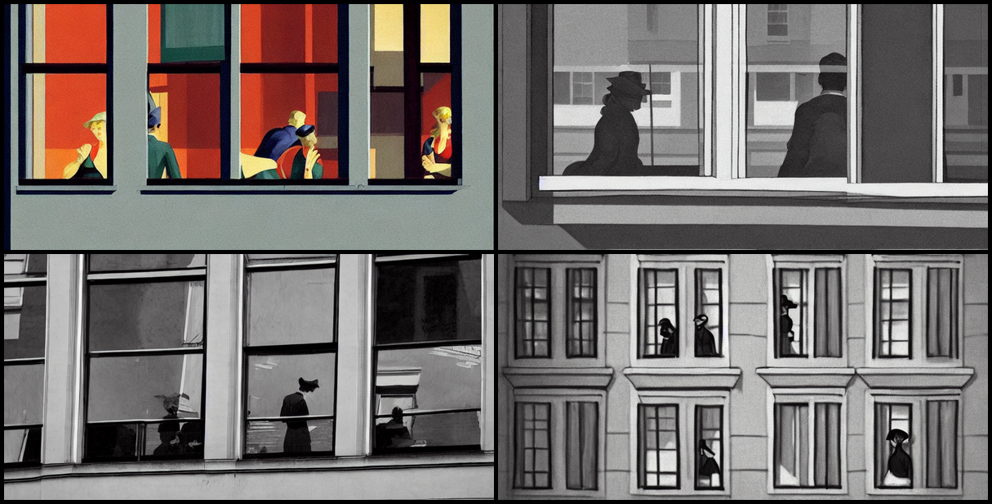

time: 1min 25s (started: 2022-11-09 04:42:01 +00:00)


In [3]:
text_prompts = "people looking out the lonely city street from windows of buildings in a Edward Hopper style. detailed, romantic, enchanting, trending on artstation."
batch_name = "hopper-street"
sd.config.collage.ncols = 2

results = sd.imagine(
    text_prompts, 
    batch_name=batch_name, 
    num_samples=4, 
    guidance_scale=9,
    width=800,
    height=400,
    num_inference_steps=150,
)

## Inpaint images

Prompt:  people looking out the lonely city street from windows of buildings in a Edward Hopper style. detailed, romantic, enchanting, trending on artstation.


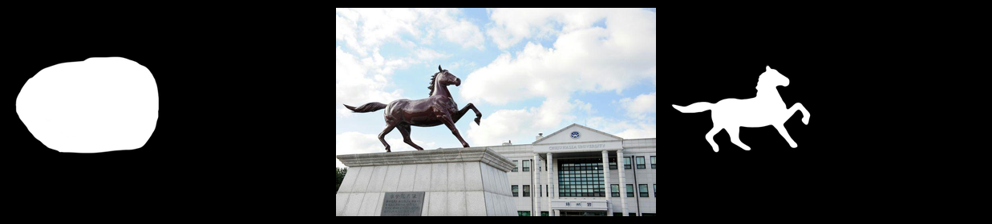

time: 2.6 s (started: 2022-11-09 04:43:26 +00:00)


In [4]:
base_url = "https://github.com/entelecheia/ekorpkit-book/raw/main/assets/figs"
init_image_path = f"{base_url}/chu-horse.png"
mask_image_path = f"{base_url}/chu-horse-masking-rough.png"
mask_image_exact_path = f"{base_url}/chu-horse-masking-exact.png"

init_image = eKonf.load_image(init_image_path)
mask_image = eKonf.load_image(mask_image_path)
mask_image_exact = eKonf.load_image(mask_image_exact_path)

sd.collage([mask_image, init_image, mask_image_exact])

Prompt: a golden statue of an eagle with clouds, colorful painting by Tanya Hern, mural on the roof, digital art, artwork, beautiful, colorful, visual art on landscape, surrealism, watercolor, vivid by stunning


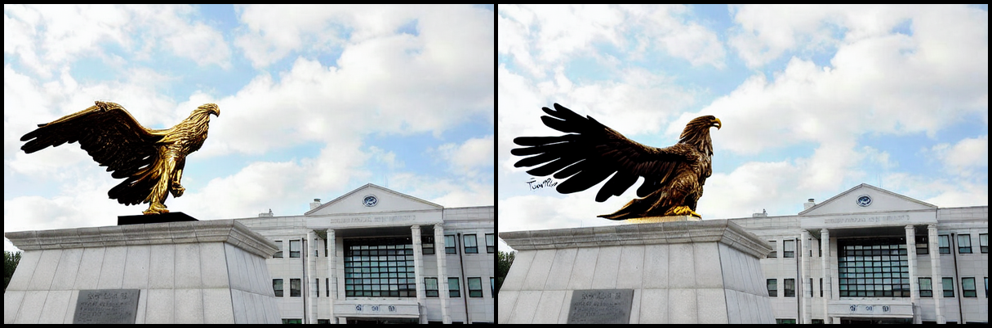

time: 1min 15s (started: 2022-11-09 02:25:19 +00:00)


In [5]:
prompt = "a golden statue of an eagle with clouds, colorful painting by Tanya Hern, mural on the roof, digital art, artwork, beautiful, colorful, visual art on landscape, surrealism, watercolor, vivid by stunning"
batch_name = "inpaint-halla"
sd.config.collage.ncols = 3

results = sd.imagine(
    prompt, 
    batch_name=batch_name,
    mode="inpaint",
    init_image=init_image_path,
    mask_image=mask_image_path,
    num_samples=3,
    num_images_per_prompt=1,
    inpaint_strength=10, 
    num_inference_steps=100,
)

## Stitch images

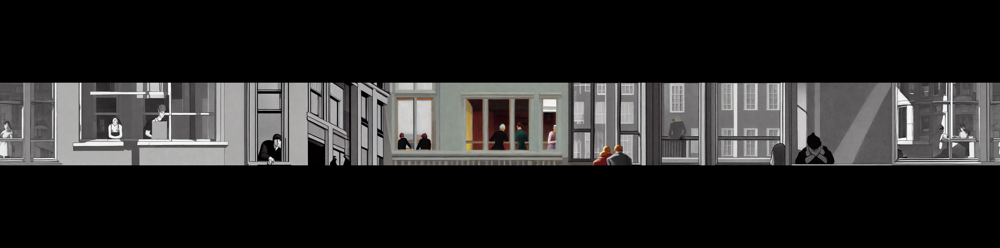

INFO:ekorpkit.models.art.stable: >> elapsed time to imagine: 0:03:12.927015


time: 3min 12s (started: 2022-11-09 04:43:29 +00:00)


In [5]:
text_prompts = "people looking out the lonely city street from windows of buildings in a Edward Hopper style. detailed, romantic, enchanting, trending on artstation."
batch_name = "city-stitch"

results = sd.imagine(
    text_prompts, 
    mode="stitch",
    batch_name=batch_name, 
    num_samples=6, 
    num_images_per_prompt=2,
    guidance_scale=7,
    inpaint_strength=10, 
)

To view the panorama, upload the image to [renderstuff](https://renderstuff.com/tools/360-panorama-web-viewer/).

## Collage Images

Prompt: examining documents and detailed white background, elegant detailed digital painting, concept art, matte, sharp focus, 4k ultra hd, illustration, magical, unreal engine, octane render, cinematic lighting, wide angle establishing shot, extremely high detail


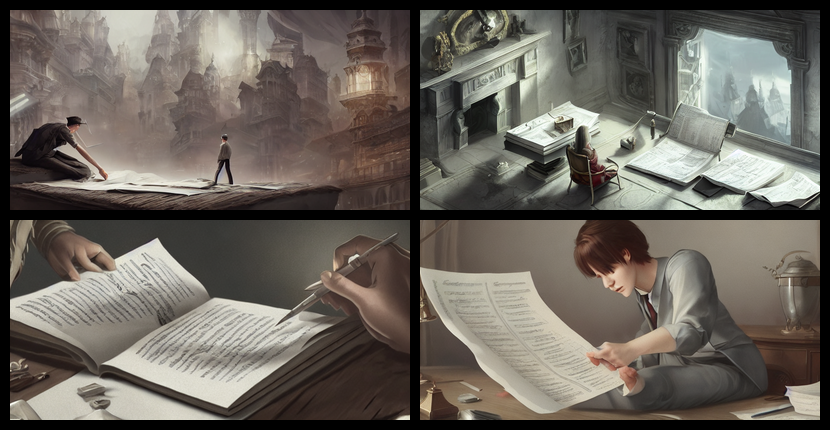

time: 1.99 s (started: 2022-11-08 09:54:01 +00:00)


In [3]:
sd.collage(batch_name="lecture", batch_num=9, ncols=2, collage_width=800)

## Show Configuration

In [7]:
sd.show_config(batch_name="lecture", batch_num=12)

INFO:ekorpkit.batch:Using existing path: /content/drive/MyDrive/workspace/projects/ekorpkit-book/disco-imagen
INFO:ekorpkit.batch:Merging config with args: {}
INFO:ekorpkit.batch:Batch name: lecture, Batch num: 12


{'_target_': 'ekorpkit.models.art.stable.StableDiffusion',
 'autoload': True,
 'batch': {'batch_name': 'lecture',
           'batch_num': 12,
           'batch_run_pairs': None,
           'batch_run_params': None,
           'clear_output': True,
           'display_collage': True,
           'max_display_image_width': 1000,
           'num_images_per_prompt': 1,
           'num_samples': 1,
           'random_seed': True,
           'resume_latest': False,
           'resume_run': False,
           'run_to_resume': 'latest',
           'save_collage': True,
           'seed': 2175210533,
           'set_seed': 'random_seed'},
 'collage': {'bg_color': 'black',
             'clear_output': True,
             'collage_width': 1200,
             'cols': -1,
             'crop_to_min_size': False,
             'fontsize': 12,
             'max_images': 6,
             'ncols': 3,
             'padding': 5,
             'show_filename': False,
             'show_prompt': True},
 'device': 

## References

- [Stable Diffusion](https://github.com/CompVis/stable-diffusion)
- [Diffusers](https://github.com/huggingface/diffusers)